In [148]:
import pickle
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
from sklearn.datasets import load_boston
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import StandardScaler, QuantileTransformer, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
%config InlineBackend.figure_format = "retina"

In [89]:
a1_color = '#664c85'
a2_color = '#5b92b6'
a3_color = '#52d5bd'
a4_color = '#eeeeee'
a1_palette = 'mako'
a2_palette = 'mako_r'

# Scikit Learn Introduction - Boston Houseprices

## Initialization

In [90]:
boston_houseprices = load_boston();
var_X = boston_houseprices['data']
var_y = boston_houseprices['target']

/home/cabrera/anaconda3/envs/dsa/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California

In [91]:
# Save data to local machine
with open('../../data/binary/boston_houseprices_data.bin', 'wb') as file:
    pickle.dump(boston_houseprices, file) 

## Execution

### K-Neighbors Regression

In [92]:
def make_scatterplot_single(x_val, y_val, color = a1_color, alpha = 0.5, title = ' ', subtitle = ' ', x_label = ' ', y_label = ' '):
    sns.set(
        style = 'whitegrid',
        rc = {'figure.figsize': (20,5)}
    )

    g = sns.scatterplot(
        x = x_val,
        y = y_val,
        color = color,
        alpha = alpha
    )

    g.set_title(
        f'\n\n{title}\n\n'.title(),
        loc = 'left',
        fontdict = dict(
            fontsize = 14.5,
            fontweight = 'medium'
        )
    )

    g.set_xlabel(
        f'\n{x_label}\n\n',
        fontdict = dict(
            fontsize = 13,
            fontweight = 'medium'
        )
    )

    g.set_ylabel(
        f'\n\n{y_label}\n',
        fontdict = dict(
            fontsize = 13,
            fontweight = 'medium'
        )
    )

    plt.text(
        s = f'{subtitle}\n',
        alpha = 0.5,
        x = 0,
        y = 1.03,
        horizontalalignment = 'left',
        transform = g.transAxes
    )

    plt.text(
        s = ' ',
        x = 1.07,
        y = 1,
        transform = g.transAxes
    )

    sns.despine()

#### Before preprocessing

In [93]:
# Model fitting
var_model = KNeighborsRegressor().fit(var_X, var_y)

# Predicting values of y based on X
var_predictions = var_model.predict(var_X)

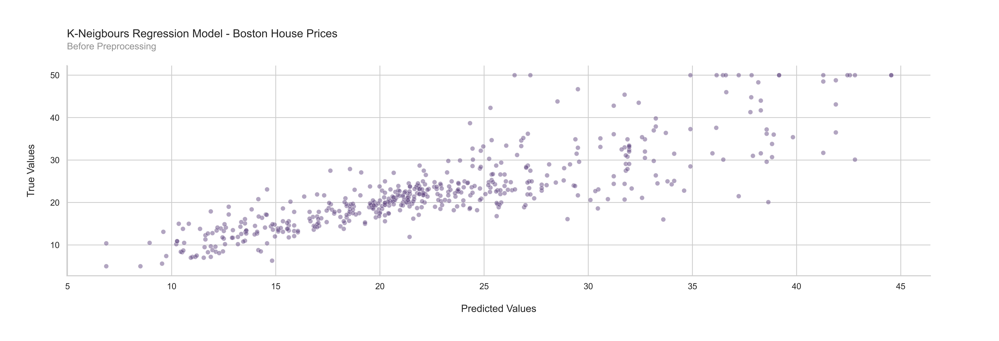

In [94]:
make_scatterplot_single(
    x_val = var_predictions,
    y_val = var_y,
    title = 'K-Neigbours Regression Model - Boston House Prices',
    subtitle = 'Before Preprocessing',
    x_label = 'Predicted Values',
    y_label = 'True Values'
)

#### After Preprocessing

In [95]:
var_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("model", KNeighborsRegressor()),
])

var_predictions = var_pipe.fit(var_X, var_y).predict(var_X)

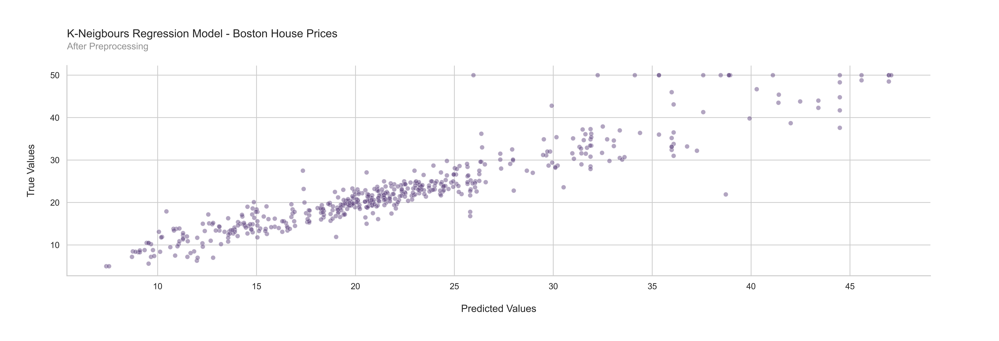

In [96]:
make_scatterplot_single(
    x_val = var_predictions,
    y_val = var_y,
    title = 'K-Neigbours Regression Model - Boston House Prices',
    subtitle = 'After Preprocessing',
    x_label = 'Predicted Values',
    y_label = 'True Values'
)

#### After Preprocessing with Grid Search and Cross Validation

In [97]:
var_pipe.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('model', KNeighborsRegressor())],
 'verbose': False,
 'scaler': StandardScaler(),
 'model': KNeighborsRegressor(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'model__algorithm': 'auto',
 'model__leaf_size': 30,
 'model__metric': 'minkowski',
 'model__metric_params': None,
 'model__n_jobs': None,
 'model__n_neighbors': 5,
 'model__p': 2,
 'model__weights': 'uniform'}

In [98]:
var_model = GridSearchCV(
    estimator = var_pipe,
    param_grid = dict(model__n_neighbors = range(1,11)), # Checking from 1-10 on what is the best number of neighbours to use
    cv = 3, # Dividing the data into three and cross validating it
)

var_model.fit(var_X, var_y)
df_model_cvresults = pd.DataFrame(var_model.cv_results_)

df_model_cvresults

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.005941,0.000200,0.005531,0.000670,1,{'model__n_neighbors': 1},0.226933,0.432998,0.127635,0.262522,0.127179,10
1,0.004223,0.001446,0.005215,0.001073,2,{'model__n_neighbors': 2},0.358216,0.409229,0.172294,0.313246,0.101821,9
2,0.002909,0.000754,0.004840,0.001071,3,{'model__n_neighbors': 3},0.413515,0.476651,0.318534,0.402900,0.064986,1
3,0.002636,0.000651,0.004542,0.000931,4,{'model__n_neighbors': 4},0.475349,0.402495,0.273014,0.383619,0.083675,7
4,0.003446,0.000640,0.004473,0.000520,5,{'model__n_neighbors': 5},0.512318,0.347951,0.262590,0.374286,0.103638,8
5,0.003821,0.000558,0.005811,0.000556,6,{'model__n_neighbors': 6},0.533611,0.389504,0.248482,0.390532,0.116406,6
6,0.003333,0.000672,0.005385,0.000487,7,{'model__n_neighbors': 7},0.544782,0.385199,0.243668,0.391216,0.123003,5
7,0.002838,0.000573,0.004213,0.000472,8,{'model__n_neighbors': 8},0.589644,0.394650,0.209714,0.398003,0.155124,2
8,0.003068,0.000815,0.004891,0.000740,9,{'model__n_neighbors': 9},0.590352,0.407556,0.185253,0.394387,0.165643,3
9,0.002893,0.000238,0.006788,0.002641,10,{'model__n_neighbors': 10},0.616510,0.395077,0.164023,0.391870,0.184741,4


In [99]:
df_model_cvresults.groupby('rank_test_score').get_group(1)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
2,0.002909,0.000754,0.00484,0.001071,3,{'model__n_neighbors': 3},0.413515,0.476651,0.318534,0.4029,0.064986,1


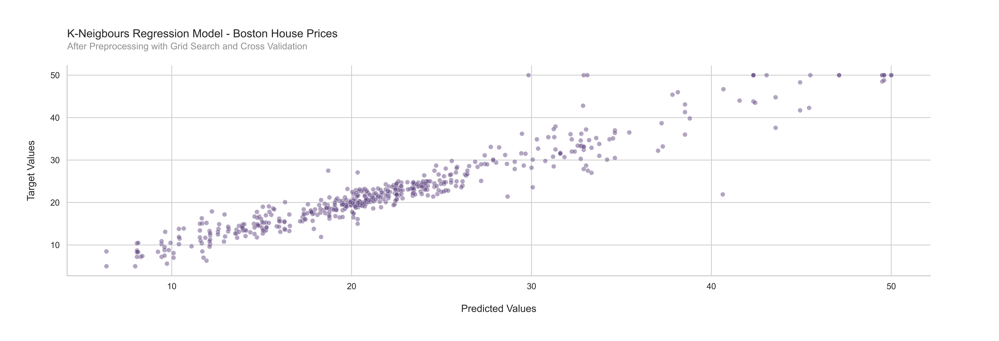

In [100]:
var_predictions = var_model.predict(var_X)

make_scatterplot_single(
    x_val = var_predictions,
    y_val = var_y,
    title = 'K-Neigbours Regression Model - Boston House Prices',
    subtitle = 'After Preprocessing with Grid Search and Cross Validation',
    x_label = 'Predicted Values',
    y_label = 'Target Values'
)

# Scikit Learn - Preprocessing

## Initialization

In [101]:
df_drawndata = pd.read_csv(r'../../data/csv/drawndata2.csv')
df_drawndata

,x,y,z
0,469.759355,453.574946,a
1,535.331819,435.221848,a
2,504.285526,437.767578,a
3,469.891398,368.371652,a
4,405.425622,403.141546,a
...,...,...,...
212,600.143988,80.491534,b
213,568.999685,83.044558,b
214,618.746701,76.644596,b
215,623.827439,33.224234,b


In [102]:
df_drawndata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217 entries, 0 to 216
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       217 non-null    float64
 1   y       217 non-null    float64
 2   z       217 non-null    object 
dtypes: float64(2), object(1)
memory usage: 5.2+ KB


## Execution

### Standard Scaler

In [103]:
var_X = df_drawndata[['x', 'y']].values
var_y = df_drawndata['z'].isin(['a'])

In [104]:
def make_scatterplot_multi(x_val, y_val, hue, figure_size = (20, 5), alpha = 0.5, palette = a1_palette, title = ' ', subtitle = ' ', x_label = ' ', y_label = ' '):
    sns.set(
        style = 'whitegrid',
        rc = {'figure.figsize': figure_size}
    )

    g = sns.scatterplot(
        x = x_val,
        y = y_val,
        alpha = alpha,
        hue = hue,
        palette = palette
    )

    sns.move_legend(
        obj = g,
        loc = 'right',
        bbox_to_anchor = (1, 1.1),
        ncol = 3,
        title = None,
        frameon = False
    )

    g.set_title(
        f'\n\n{title}\n\n'.title(),
        loc = 'left',
        fontdict = dict(
            fontsize = 14.5,
            fontweight = 'medium'
        )
    )

    g.set_xlabel(
        f'\n{x_label}\n\n',
        fontdict = dict(
            fontsize = 13,
            fontweight = 'medium'
        )
    )

    g.set_ylabel(
        f'\n\n{y_label}\n',
        fontdict = dict(
            fontsize = 13,
            fontweight = 'medium'
        )
    )

    plt.text(
        s = f'{subtitle}\n',
        alpha = 0.5,
        x = 0,
        y = 1.03,
        horizontalalignment = 'left',
        transform = g.transAxes
    )

    plt.text(
        s = ' ',
        x = 1.07,
        y = 1,
        transform = g.transAxes
    )

    sns.despine()

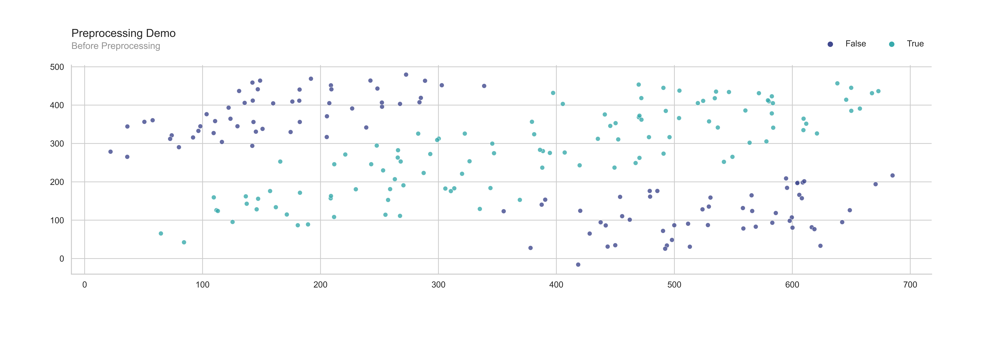

In [105]:
make_scatterplot_multi(
    x_val = var_X[:, 0],
    y_val = var_X[:, 1],
    hue = var_y,
    alpha = 0.8,
    title = 'Preprocessing demo',
    subtitle = 'Before Preprocessing'
)

#### Scaling X

In [106]:
var_X_scaled_standard = StandardScaler().fit_transform(var_X)

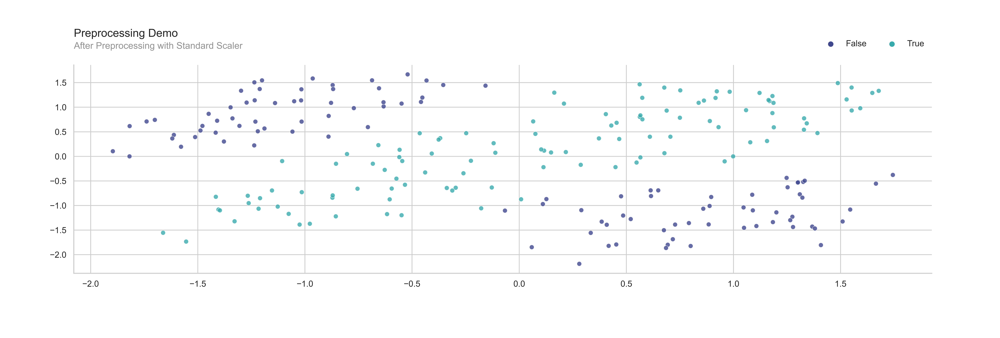

In [107]:
make_scatterplot_multi(
    x_val = var_X_scaled_standard[:, 0],
    y_val = var_X_scaled_standard[:, 1],
    hue = var_y,
    alpha = 0.8,
    title = 'Preprocessing demo',
    subtitle = 'After Preprocessing with Standard Scaler'
)

In [108]:
df_drawndata_original = pd.DataFrame(dict(
    X1 = var_X[:, 0],
    X2 = var_X[:, 1],
    y = var_y,
    kind = 'original'
))

df_drawndata_scaled_standard = pd.DataFrame(dict(
    X1 = var_X_scaled_standard[:, 0],
    X2 = var_X_scaled_standard[:, 1],
    y = var_y,
    kind = 'scaled'
))

df_drawndata_union_scaled_standard = pd.concat([df_drawndata_original, df_drawndata_scaled_standard])

In [143]:
def make_facet_scatterplot(data, x, y, row, hue, title, palette = a1_palette, sharex = False, sharey = False):
    sns.set(
        style = 'whitegrid',
        rc = {'figure.dpi': 300}
    )

    g = sns.FacetGrid(
        data = data,
        row = row,
        hue = hue,
        palette = palette,
        sharex = sharex,
        sharey = sharey,
        height = 3,
        aspect = 6
    )

    g.map_dataframe(
        func = sns.scatterplot,
        x = x,
        y = y,
    )

    plt.subplots_adjust(
        hspace = 0.5,
        wspace = 0.5
    )

    for array_of_axes in g.axes:
        for axes in array_of_axes:
            axes.set_ylabel(
                f"\n\n\n{axes.get_title()[axes.get_title().find('= ') + 2:].upper()}\n"
            )
            axes.set_title(' ')

    plt.text(
        s = ' ',
        x = 1.04,
        y = 1,
        transform = g.axes[len(g.axes)//2][0].transAxes
    )

    g.axes[-1][0].set_xlabel(' \n\n\n')

    g.axes[0][0].set_title(
        f"\n\n\n{title}\n\n\n".upper(),
        loc = 'left',
        fontdict = dict(
            fontsize = 14,
            fontweight = 'bold'
        )
    )

    g.add_legend()
    sns.move_legend(
        obj = g,
        loc = 'lower left',
        bbox_to_anchor = (0.03, 0.97),
        ncol = 3,
        title = None,
        frameon = False
    )

In [144]:
make_facet_scatterplot(
    data = df_drawndata_union_scaled_standard,
    x = 'X1',
    y = 'X2',
    row = 'kind',
    hue = 'y',
    title = 'Standard Scaler'
)

### Quantile Scaler

In [145]:
var_X_scaled_quantile = QuantileTransformer(n_quantiles = 100).fit_transform(var_X)

df_drawndata_scaled_quantile = pd.DataFrame(dict(
    X1 = var_X_scaled_quantile[:, 0],
    X2 = var_X_scaled_quantile[:, 1],
    y = var_y,
    kind = 'scaled'
))

df_drawndata_union_scaled_quantile = pd.concat([df_drawndata_original, df_drawndata_scaled_quantile])

In [146]:
make_facet_scatterplot(
    data = df_drawndata_union_scaled_quantile,
    x = 'X1',
    y = 'X2',
    hue = 'y',
    row = 'kind',
    title = 'Quantile Transformer'
)

In [120]:
var_pipe = Pipeline([
    ("scale", QuantileTransformer(n_quantiles=100)),
    ("model", LogisticRegression())
])

var_predictions = var_pipe.fit(var_X, var_y).predict(var_X)

In [151]:
df_drawndata_scaled_quantile_predicted = pd.DataFrame(dict(
    X1 = var_X_scaled_quantile[:, 0],
    X2 = var_X_scaled_quantile[:, 1],
    y = var_predictions,
    kind = 'predicted'
))

df_drawndata_union_scaled_quantile_predicted = pd.concat([df_drawndata_original, df_drawndata_scaled_quantile, df_drawndata_scaled_quantile_predicted])

In [152]:
make_facet_scatterplot(
    data = df_drawndata_union_scaled_quantile_predicted,
    x = 'X1',
    y = 'X2',
    hue = 'y',
    row = 'kind',
    title = 'Quantile Transformer'
)

### Polynomial Features

In [153]:
var_pipe = Pipeline([
    ("scale", PolynomialFeatures()),
    ("model", LogisticRegression())
])

var_predictions = var_pipe.fit(var_X, var_y).predict(var_X)

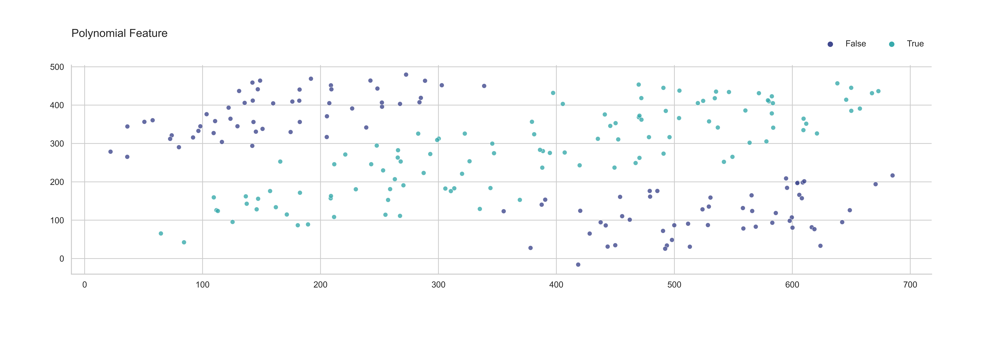

In [156]:
make_scatterplot_multi(
    x_val = var_X[:, 0],
    y_val = var_X[:, 1],
    hue = var_predictions,
    alpha = 0.8,
    title = 'Polynomial Feature'
)